### 1. YOLO v3를 이용하여 물체를 검출하는 프로그램을 수행한다. ‘yolov3.weights’ 와 ‘coco_names.txt’, ‘yolov3.cfg’ 파일은 Google drive에서 복사할 수 있다. 수행 프로그램은 다음 세 가지 중에서 하나를 사용하면 된다.

#### a. 오일석 교재 387~388쪽 프로그램을 사용한다. 이 프로그램은 OpenCV의 dnn 모듈을 사용하는 것인데, 프로그램 수행시 오류가 나타나므로 수정해서 사용하여야 한다

#### b. Step by step YOLOv3-Object detection (kaggle.com)

#### c. How to Perform Object Detection With YOLOv3 in Keras - MachineLearningMastery.com

b 와 c 는 OpenCV 대신 Keras 를 사용하는 프로그램인데, ‘yolov3.weights’파일을 이용하여 수행시킬 수 있다.

프로그램을 ‘soccer.jpg’와 ‘busy_street.jpg’에 적용하여 수행한 결과를 제시하라. 추가로 교내 도로에서 차량과 사람들이 포함된 영상을 취득하여 수행시킨 결과를
제시하라.

- OpenCV DNN 모듈 사용

In [ ]:
use_colab = True
assert use_colab in [True, False]

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import cv2 as cv
import sys

def construct_yolo_v3():
    # 데이터 경로 지정
    path = '/content/drive/MyDrive/dataset/vision_lab6/'
    class_file = path + 'coco_names.txt'
    weights = path + 'yolov3.weights'
    config = path + 'yolov3.cfg'

    # 클래스 이름 파일 불러오기
    with open(class_file, 'r') as f:
        class_names = [line.strip() for line in f.readlines()]

    # YOLO 모델 로드
    model = cv.dnn.readNet(weights, config)

    # 출력 레이어 이름 가져오기
    layer_names = model.getLayerNames()
    out_layer_indexes = model.getUnconnectedOutLayers().flatten()  # flatten()을 사용하여 배열을 1차원으로 만듦
    out_layers = [layer_names[i - 1] for i in out_layer_indexes]

    return model, class_names, out_layers

In [ ]:
def yolo_detect(img, yolo_model, out_layers):
  height, width = img.shape[0], img.shape[1]
  test_img = cv.dnn.blobFromImage(img, 1.0/256, (448,448), (0,0,0), swapRB=True)
  yolo_model.setInput(test_img)
  output3 = yolo_model.forward(out_layers)

  box, conf, id = [], [], []
  for output in output3:
      for vec85 in output:
          scores = vec85[5:]
          class_id = np.argmax(scores)
          confidence = scores[class_id]
          if confidence > 0.5:
              center_x, center_y = int(vec85[0]*width), int(vec85[1]*height)
              w, h = int(vec85[2]*width), int(vec85[3]*height)
              x, y = int(center_x - w/2), int(center_y - h/2)
              box.append([x, y, x+w, y+h])
              conf.append(float(confidence))
              id.append(class_id)

  ind = cv.dnn.NMSBoxes(box, conf, 0.5, 0.4)
  objects = [box[i] + [conf[i]] + [id[i]] for i in range(len(box)) if i in ind]
  return objects

In [ ]:
# Import the required function from google.colab.patches
from google.colab.patches import cv2_imshow

model, class_names, out_layers = construct_yolo_v3()
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

- soccer.jpg

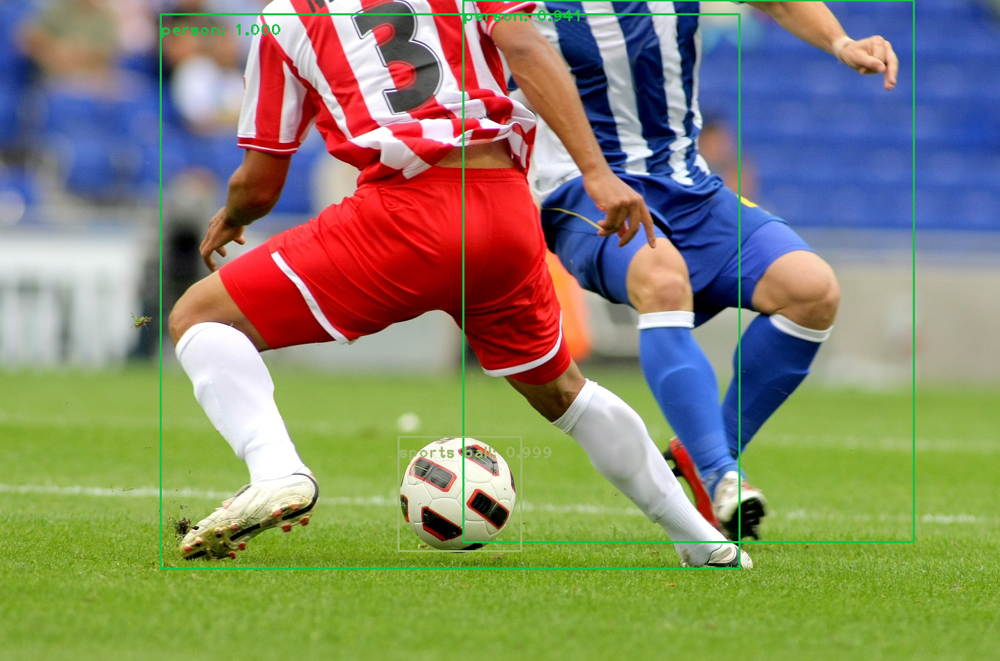

In [ ]:
# 이미지를 불러옵니다.
img = cv.imread('/content/drive/MyDrive/dataset/vision_lab6/soccer.jpg')
if img is None:
    sys.exit("파일이 없습니다.")

# YOLO 검출 함수를 호출합니다. 이제 model도 함께 전달해야 합니다.
res = yolo_detect(img, model, out_layers)

# 결과를 이미지에 표시합니다.
for i in range(len(res)):
    x1, y1, x2, y2, confidence, id = res[i]
    text_str = f"{class_names[id]}: {confidence:.3f}"
    cv.rectangle(img, (x1, y1), (x2, y2), colors[id], 2)
    cv.putText(img, text_str, (x1, y1+30), cv.FONT_HERSHEY_PLAIN, 1.5, colors[id], 2)

cv2_imshow(img)
cv.waitKey(0)  # waitKey의 인자를 0으로 설정하여 무한 대기합니다.
cv.destroyAllWindows()

- busy_street.jpg

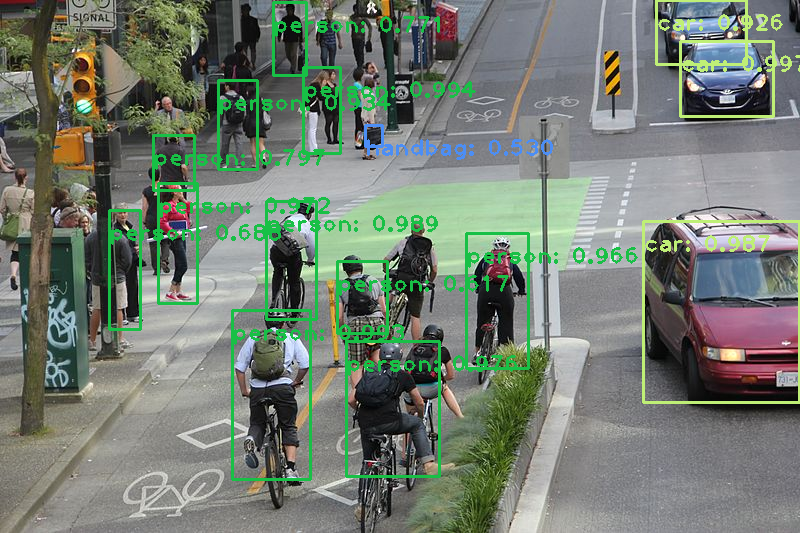

In [ ]:
# 이미지를 불러옵니다.
img = cv.imread('/content/drive/MyDrive/dataset/vision_lab6/busy_street.jpg')
if img is None:
    sys.exit("파일이 없습니다.")

# YOLO 검출 함수를 호출합니다. 이제 model도 함께 전달해야 합니다.
res = yolo_detect(img, model, out_layers)

# 결과를 이미지에 표시합니다.
for i in range(len(res)):
    x1, y1, x2, y2, confidence, id = res[i]
    text_str = f"{class_names[id]}: {confidence:.3f}"
    cv.rectangle(img, (x1, y1), (x2, y2), colors[id], 2)
    cv.putText(img, text_str, (x1, y1+30), cv.FONT_HERSHEY_PLAIN, 1.5, colors[id], 2)

cv2_imshow(img)
cv.waitKey(0)  # waitKey의 인자를 0으로 설정하여 무한 대기합니다.
cv.destroyAllWindows()

- 교내 도로 사진 1

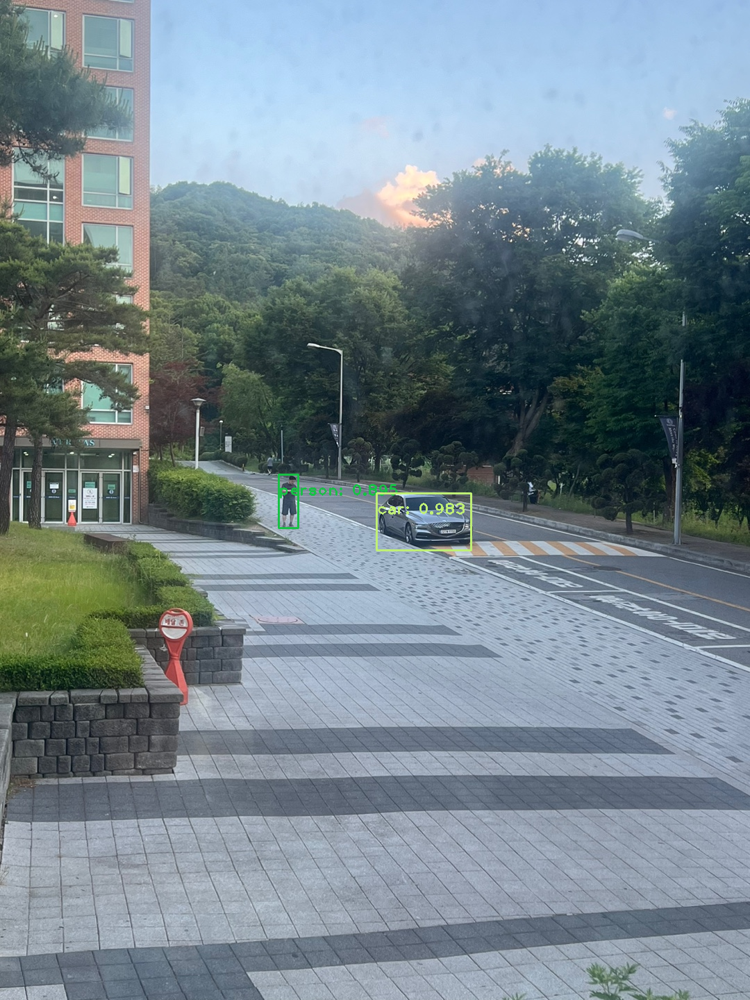

In [ ]:
img = cv.imread('/content/drive/MyDrive/dataset/vision_lab6/school_picture1.jpeg')
if img is None:
    sys.exit("파일이 없습니다.")

res = yolo_detect(img, model, out_layers)

for i in range(len(res)):
    x1, y1, x2, y2, confidence, id = res[i]
    text_str = f"{class_names[id]}: {confidence:.3f}"
    cv.rectangle(img, (x1, y1), (x2, y2), colors[id], 2)
    cv.putText(img, text_str, (x1, y1+30), cv.FONT_HERSHEY_PLAIN, 1.5, colors[id], 2)

cv2_imshow(img)
cv.waitKey(0)
cv.destroyAllWindows()

- 교내 도로 사진 2

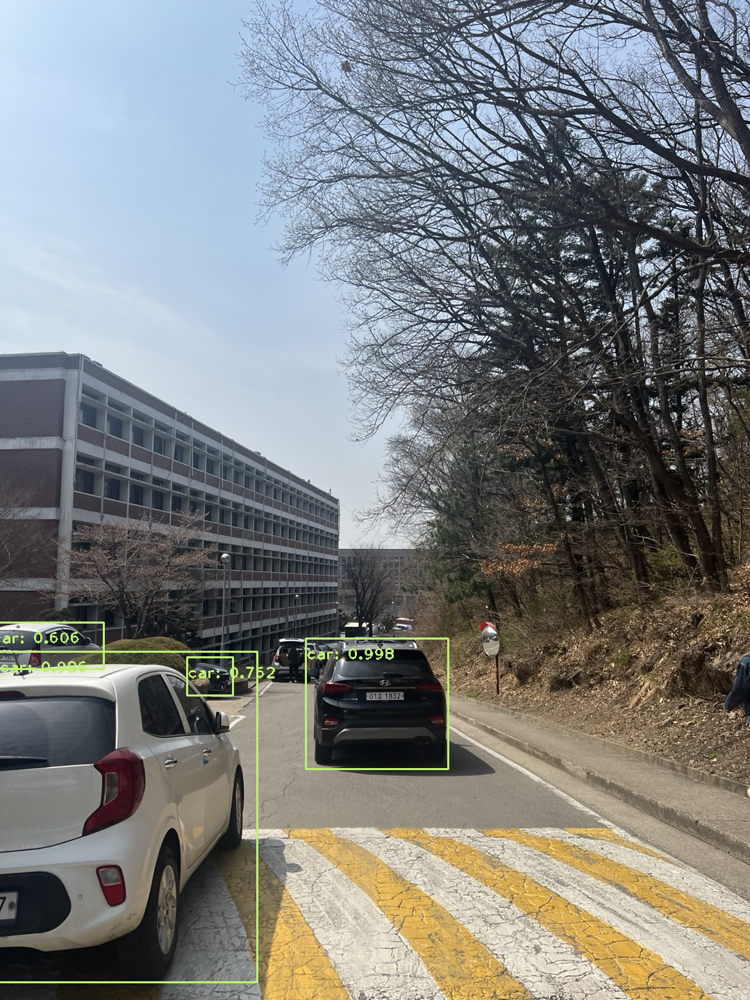

In [ ]:
img = cv.imread('/content/drive/MyDrive/dataset/vision_lab6/school_picture2.jpeg')
if img is None:
    sys.exit("파일이 없습니다.")

res = yolo_detect(img, model, out_layers)

for i in range(len(res)):
    x1, y1, x2, y2, confidence, id = res[i]
    text_str = f"{class_names[id]}: {confidence:.3f}"
    cv.rectangle(img, (x1, y1), (x2, y2), colors[id], 2)
    cv.putText(img, text_str, (x1, y1+30), cv.FONT_HERSHEY_PLAIN, 1.5, colors[id], 2)

cv2_imshow(img)
cv.waitKey(0)
cv.destroyAllWindows()

- 교내 도로 사진 3

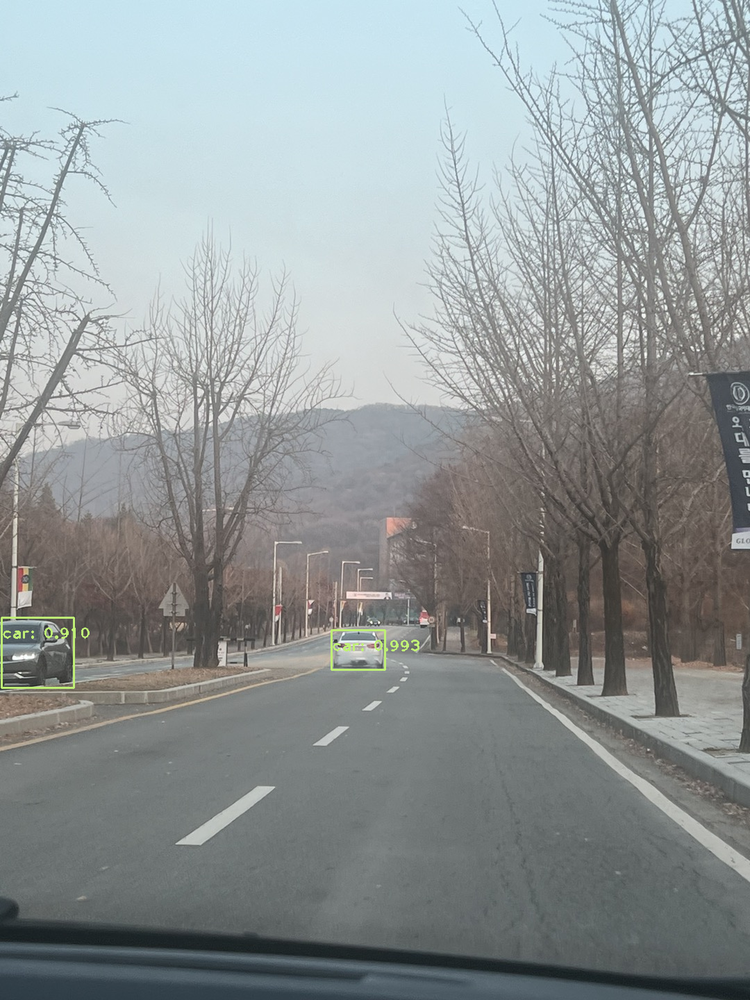

In [ ]:
# 이미지를 불러옵니다.
img = cv.imread('/content/drive/MyDrive/dataset/vision_lab6/school_picture3.jpeg')
if img is None:
    sys.exit("파일이 없습니다.")

# YOLO 검출 함수를 호출합니다. 이제 model도 함께 전달해야 합니다.
res = yolo_detect(img, model, out_layers)

# 결과를 이미지에 표시합니다.
for i in range(len(res)):
    x1, y1, x2, y2, confidence, id = res[i]
    text_str = f"{class_names[id]}: {confidence:.3f}"
    cv.rectangle(img, (x1, y1), (x2, y2), colors[id], 2)
    cv.putText(img, text_str, (x1, y1+30), cv.FONT_HERSHEY_PLAIN, 1.5, colors[id], 2)

cv2_imshow(img)
cv.waitKey(0)  # waitKey의 인자를 0으로 설정하여 무한 대기합니다.
cv.destroyAllWindows()

### 2.YOLO v3에서는 물체 검출을 어떻게 수행하는지 인터넷을 검색하여 조사하고 수행 절차를 그림을 이용하여 설명하라.

#### YOLO V3 모델 특징
- Feature Pyramid Network 유사한 기법을 적용하여 3개의 Feature Map Output에서 각각 3개의 서로 다른 크기와 scale을 가진 anchor box 로 Detection

- Classification단을 보다 높은 Classification을 가지는 Darknet-53

- Multi Labels 예측: Softmax가 아닌 Sigmoid 기반의 logistic classifier로 개별 Object의 Multi labels 예측

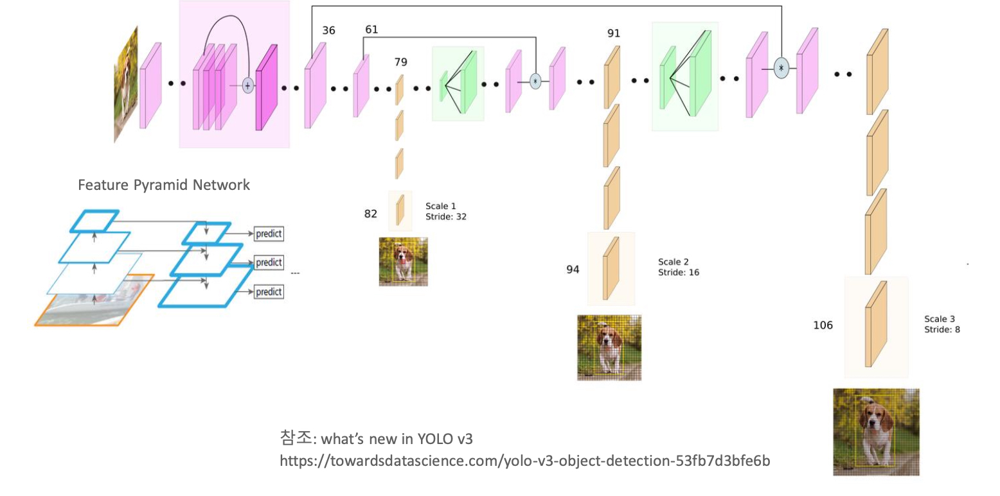

1. **Input Image**: 입력된 이미지는 여러 계층의 **convolutional layers**를 통해 특징을 추출.
2. **Feature Pyramid Network (FPN)**: 추출된 특징은 **FPN**을 통해 다양한 크기와 스케일에서 물체를 감지할 수 있도록 처리.
3. **Multi-Scale Prediction**: 세 가지 다른 스케일(Stride 32, 16, 8)에서 예측을 수행하여, 각 격자에서 여러 개의 **bounding boxes**와 **class probabilities**를 예측.
4. **Bounding Box Prediction**: 각 스케일에서 네트워크는 **bounding boxes**와 **class probabilities**를 예측.
5. **Output Processing**: 모든 스케일에서의 예측을 처리하여 중복 감지를 제거하고 **non-maximum suppression (NMS)**를 사용하여 확신도가 낮은 감지를 필터링.